# Energy Dataset Exploratory Data Analysis

This dataset is taken from a [Git Repository](https://github.com/LuisM78/Appliances-energy-prediction-data) of data for the publication:

Data driven prediction models of energy use of appliances in a low-energy house. Luis M. Candanedo, Véronique Feldheim, Dominique Deramaix. Energy and Buildings, Volume 140, 1 April 2017, Pages 81-97, ISSN 0378-7788, http://dx.doi.org/10.1016/j.enbuild.2017.01.083.

## The Task

Do an Exploratory Data Analysis on the energy dataset. <br> Keeping in mind : **Understand energy usage by appliances and the attributes that contribute to aggregate energy usage.**

### General Tips Followed 
> [Chloe Mawer, Jonathan Whitmore - Exploratory Data Analysis in Python - PyCon 2017](https://www.youtube.com/watch?v=W5WE9Db2RLU)

> - Before plotting/joining/doing something, have a question or hypothesis that you want to investigate
> - Draw a plot of what you want to see on paper to sketch the idea
> - Write it down, then make the plan on how to get there
> - How do you know you aren't fooling yourself
> - What else can I check if this is actually true?
> - What evidence could there be that it's wrong?

### Tidy Data
> Hadley Wickham's concept of a **tidy dataset** summarized as:

> - Each variable forms a column
> - Each observation forms a row
> - Each type of observational unit forms a table

In [1]:
# Uncomment and run if any of the following libraries not available
#!pip install tqdm
#!pip install missingno
#!pip install pandas_profiling
#!pip install folium
#!pip install pivottablejs

In [4]:
# To output plotting commands display inline within frontends
%matplotlib inline
#To obtain retina-display quality for figures into code
%config InlineBackend.figure_format='retina'

# To use features which will appear in newer versions while having an older release of Python
from __future__ import absolute_import, division, print_function

# Plotting
import matplotlib as mpl
from matplotlib import pyplot as plt
from matplotlib.pyplot import GridSpec
import seaborn as sns
sns.set_context("poster", font_scale=1.3)
import folium

# Basic Wrangling 
import numpy as np
import pandas as pd
from pandas.tools.plotting import scatter_matrix

# System Packages 
import os, sys
import warnings
warnings.filterwarnings('ignore')

# EDA Tools 
import missingno as msno
import pandas_profiling
import pivottablejs

#from tqdm import tqdm
from sklearn.datasets import make_blobs
import time

# Update matplotlib defaults to something nicer 
mpl_update = {'font.size':16,
              'xtick.labelsize':14,
              'ytick.labelsize':14,
              'figure.figsize':[12.0,8.0],
              'axes.color_cycle':['#0055A7', '#2C3E4F', '#26C5ED', '#00cc66', '#D34100', '#FF9700','#091D32'], 
              'axes.labelsize':20,
              'axes.labelcolor':'#677385',
              'axes.titlesize':20,
              'lines.color':'#0055A7',
              'lines.linewidth':3,
              'text.color':'#677385'}
mpl.rcParams.update(mpl_update)

### Description of the Data Columns (Units)
> Where indicated, data from the nearest airport weather station (Chièvres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis, rp5.ru. Permission was obtained from Reliable Prognosis for the distribution of the **4 months of data**.
<table>
    <thead class="valign-top">
        <tr>
            <th scope="col" class="rowsep-1 align-left">Variables, Description</th>
            <th scope="col" class="rowsep-1 align-left">Units</th>
            <th scope="col" class="rowsep-1 align-left">Number of Features</th>
        </tr>
    </thead>
    <tbody>
        <tr>
        <th class="align-left" scope="row">date, Date time stamp</th>
            <td class="align-left">year-month-day hour:min:s</td>
            <td class="align-char">–</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">Appliances, Appliances energy consumption</th>
            <td class="align-left">Wh</td>
            <td class="align-char">1</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">Lights, Light energy consumption</th>
            <td class="align-left">Wh</td>
            <td class="align-char">2</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T1, Temperature in kitchen area</th>
            <td class="align-left">°C</td>
            <td class="align-char">3</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_1, Humidity in kitchen area</th>
            <td class="align-left">%</td>
            <td class="align-char">4</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T2, Temperature in living room area</th>
            <td class="align-left">°C</td>
            <td class="align-char">5</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_2, Humidity in living room area</th>
            <td class="align-left">%</td>
            <td class="align-char">6</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T3, Temperature in laundry room area</th>
            <td class="align-left">°C</td>
            <td class="align-char">7</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_3, Humidity in laundry room area</th>
            <td class="align-left">%</td>
            <td class="align-char">8</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T4, Temperature in office room</th>
            <td class="align-left">°C</td>
            <td class="align-char">9</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_4, Humidity in office room</th>
            <td class="align-left">%</td>
            <td class="align-char">10</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T5, Temperature in bathroom</th>
            <td class="align-left">°C</td>
            <td class="align-char">11</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_5, Humidity in bathroom</th>
            <td class="align-left">%</td>
            <td class="align-char">12</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T6, Temperature outside the building (north side)</th>
            <td class="align-left">°C</td>
            <td class="align-char">13</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_6, Humidity outside the building (north side)</th>
            <td class="align-left">%</td>
            <td class="align-char">14</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T7, Temperature in ironing room</th>
            <td class="align-left">°C</td>
            <td class="align-char">15</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_7, Humidity in ironing room</th>
            <td class="align-left">%</td>
            <td class="align-char">16</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T8, Temperature in teenager room 2</th>
            <td class="align-left">°C</td>
            <td class="align-char">17</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_8, Humidity in teenager room 2</th>
            <td class="align-left">%</td>
            <td class="align-char">18</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T9, Temperature in parents room</th>
            <td class="align-left">°C</td>
            <td class="align-char">19</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_9, Humidity in parents room</th>
            <td class="align-left">%</td>
            <td class="align-char">20</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T_out, Temperature outside (from Chièvres weather station)</th>
            <td class="align-left">°C</td>
            <td class="align-char">21</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">Press_mm_hg, Pressure (from Chièvres weather station)</th>
            <td class="align-left">mm Hg</td>
            <td class="align-char">22</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_out, Humidity outside (from Chièvres weather station)</th>
            <td class="align-left">%</td>
            <td class="align-char">23</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">Windspeed, Windspeed (from Chièvres weather station)</th>
            <td class="align-left">m/s</td>
            <td class="align-char">24</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">Visibility, Visibility (from Chièvres weather station)</th>
            <td class="align-left">km</td>
            <td class="align-char">25</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">Tdewpoint, Dew point temp (from Chièvres weather station)</th>
            <td class="align-left">°C</td>
            <td class="align-char">26</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">rv1, Random Variable 1</th>
            <td class="align-left">Non dimensional</td>
            <td class="align-char">27</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">rv2, Random Variable 2</th>
            <td class="align-left">Non dimensional</td>
            <td class="align-char">28</td>
        </tr>
    </tbody>
</table>

## Data Quality Assessment and Profiling
[PyCon2017 Link](https://www.youtube.com/watch?v=W5WE9Db2RLU)
Before trying to understand what information is in the data, make sure to understand what the data represents and what's missing.

### Overview 
####  Basic things to do 
* Categorical: count, count distinct, assess unique values 
* Numerical: count, min, max
* Spot-check random samples and samples that you are familiar with 
* Slice and dice 

#### Main questions
* What data isn't there? 
* Is the data that is there right? 
* Is the data being generated the way you think? 

**Other Questions to consider:**
* Are there frequent values that are default values? 
* Are there fields that represent the same information? 
* What timestamp, if any, should you use? 
* Are there numerical values reported as strings? 
* Are there special values? 
* Are there variables that are numerical but really should be categorical? 
* Is data consistent across? 
* Are there any direct relationships between fields? 
* What are the units of measurement? Are they consistent? 
* Are there obvious changes in reported data around the time of important events that affect data generation (e.g. version release)?

#### Helpful packages
* [`missingno`](https://github.com/ResidentMario/missingno)
* [`pivottablejs`](https://github.com/nicolaskruchten/jupyter_pivottablejs)
* [`pandas_profiling`](https://github.com/JosPolfliet/pandas-profiling)

#### Example backlog
* Assess the prevalence of missing data across all data fields, assess whether its missing is random or systematic, and identify patterns when such data is missing
* Identify any default values that imply missing data for a given field
* Determine sampling strategy for quality assessment and initial EDA
* For datetime data types, ensure consistent formatting and granularity of data, and perform sanity checks on all dates present in the data.
* In cases where multiple fields capture the same or similar information, understand the relationships between them and assess the most effective field to use
* Assess data type of each field
* For discrete value types, ensure data formats are consistent
* For discrete value types, assess number of distinct values and percent unique and do sanity check on types of answers
* For continuous data types, assess descriptive statistics and perform sanity check on values 
* Understand relationships between timestamps and assess which to use in analysis
* Slice data by device type, operating system, software version and ensure consistency in data across slices
* For device or app data, identify version release dates and assess data for any changes in format or value around those dates

### Missing data
*What data isn’t there?*

Questions to be considering
* Are there systematic reasons for missing data? 
* Are there fields that are always missing at the same time ? 
* Is there information in what data is missing?

In [5]:
# Loading the data from the Case Study GitHub
#df = pd.read_csv("https://raw.githubusercontent.com/eklavyasaxena/Advances-in-Data-Sciences-and-Architecture/master/ADS_CaseStudy_2/Data_for_EnergyCaseStudy/energydata_complete.csv")
df = pd.read_csv("../Data_for_EnergyCaseStudy/energydata_complete.csv")

In [6]:
df.shape

(19735, 29)

In [7]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Appliances,19735.0,97.694958,102.524891,10.000000,50.000000,60.000000,100.000000,1080.000000
lights,19735.0,3.801875,7.935988,0.000000,0.000000,0.000000,0.000000,70.000000
T1,19735.0,21.686571,1.606066,16.790000,20.760000,21.600000,22.600000,26.260000
RH_1,19735.0,40.259739,3.979299,27.023333,37.333333,39.656667,43.066667,63.360000
T2,19735.0,20.341219,2.192974,16.100000,18.790000,20.000000,21.500000,29.856667
RH_2,19735.0,40.420420,4.069813,20.463333,37.900000,40.500000,43.260000,56.026667
T3,19735.0,22.267611,2.006111,17.200000,20.790000,22.100000,23.290000,29.236000
RH_3,19735.0,39.242500,3.254576,28.766667,36.900000,38.530000,41.760000,50.163333
T4,19735.0,20.855335,2.042884,15.100000,19.530000,20.666667,22.100000,26.200000
RH_4,19735.0,39.026904,4.341321,27.660000,35.530000,38.400000,42.156667,51.090000


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
date           19735 non-null object
Appliances     19735 non-null int64
lights         19735 non-null int64
T1             19735 non-null float64
RH_1           19735 non-null float64
T2             19735 non-null float64
RH_2           19735 non-null float64
T3             19735 non-null float64
RH_3           19735 non-null float64
T4             19735 non-null float64
RH_4           19735 non-null float64
T5             19735 non-null float64
RH_5           19735 non-null float64
T6             19735 non-null float64
RH_6           19735 non-null float64
T7             19735 non-null float64
RH_7           19735 non-null float64
T8             19735 non-null float64
RH_8           19735 non-null float64
T9             19735 non-null float64
RH_9           19735 non-null float64
T_out          19735 non-null float64
Press_mm_hg    19735 non-null float64
RH_out         19735 n

In [10]:
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d %H:%M:%S', utc=True)

In [11]:
all_columns = df.columns.tolist()
all_columns

['date',
 'Appliances',
 'lights',
 'T1',
 'RH_1',
 'T2',
 'RH_2',
 'T3',
 'RH_3',
 'T4',
 'RH_4',
 'T5',
 'RH_5',
 'T6',
 'RH_6',
 'T7',
 'RH_7',
 'T8',
 'RH_8',
 'T9',
 'RH_9',
 'T_out',
 'Press_mm_hg',
 'RH_out',
 'Windspeed',
 'Visibility',
 'Tdewpoint',
 'rv1',
 'rv2']

#### Adding Additional Key Features
><table>
    <thead class="valign-top">
        <tr>
            <th scope="col" class="rowsep-1 align-left">Variables, Description</th>
            <th scope="col" class="rowsep-1 align-left">Units</th>
            <th scope="col" class="rowsep-1 align-left">Number of Features</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <th class="align-left" scope="row">NSM, Number of seconds from midnight</th>
            <td class="align-left">s</td>
            <td class="align-char">29</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">week_status, Week status (weekend (0) or a weekday (1))</th>
            <td class="align-left">Factor/categorical</td>
            <td class="align-char">30</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">day_of_week, Day of week (Monday(0), Tuesday(1)… Sunday(6))</th>
            <td class="align-left">Factor/categorical</td>
            <td class="align-char">31</td>
        </tr>
    </tbody>
 </table>

In [12]:
df['NSM'] = df.date.apply(lambda x: x.hour*3600 + x.minute*60 +x.second)

In [13]:
df['day_of_week'] = df.date.apply(lambda x: x.dayofweek)

In [14]:
df['week_status'] = df.day_of_week.apply(lambda x: 0 if (x == 5 or x == 6) else 1)

In [15]:
# To set Datetime column as index of the Dataframe
# df_idx = df.set_index(pd.DatetimeIndex(df['date']))

In [16]:
# Checking if the date column is unique for each and every row:
df.date.nunique() == df.shape[0]

True

In [17]:
# Checking Null Values
df.apply(lambda x: sum(x.isnull()), axis=0)

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
NSM            0
day_of_week    0
week_status    0
dtype: int64

In [18]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,NSM,day_of_week,week_status
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,61200,0,1
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,61800,0,1
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,62400,0,1
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389,63000,0,1
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,63600,0,1


## Visualize the missing-ness of data
https://github.com/ResidentMario/missingno

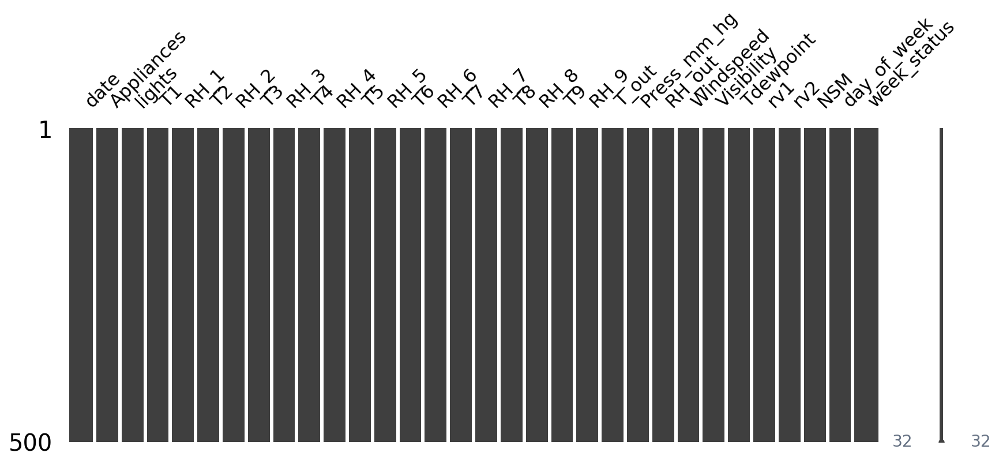

In [19]:
# Matrix of missingness of the data
msno.matrix(df.sample(500), figsize=(14, 5), width_ratios=(14, 1));

It is clear from the above matrix, that there is no data missing. But, following commands can be further used to explorate the missingness:
``` Python
  # Barchart of missingness of the data
  msno.bar(df.sample(500), figsize=(14, 5));
  
  # Correlation patterns in how the data is missing
  msno.heatmap(df.sample(500), figsize=(16, 7));
```

## Visualizing the Univariate Distributions

### 1) Energy Consumption by Appliances & Lights

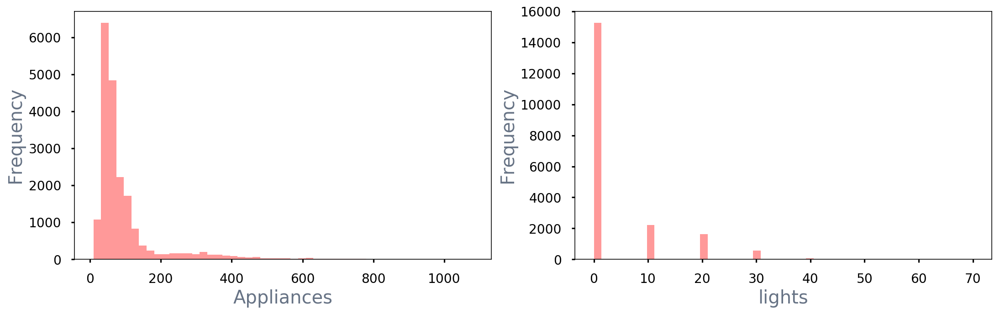

In [20]:
fig, (ax1, ax2) = plt.subplots(figsize=(18,5), ncols=2)
sns.distplot(df.Appliances, kde=False, color="red", ax=ax1)
sns.distplot(df.lights, kde=False, color="red", ax=ax2)
ax1.set_ylabel("Frequency")
ax2.set_ylabel("Frequency");

In [21]:
# Calculating Percentage of Zero Energy Consumption by Lights
total = df.lights.count()
non_zero_val = df.lights.astype(bool).sum(axis=0)
zero_val_percent = (total - non_zero_val)/total*100
print(zero_val_percent)

77.2840131746


* Appliances: Majority consumption is in the **range of 0 ~ 200 kWh**
* Lights: **77%** of observations hace **ZERO** Lights Energy Consumption

### 2) Outside Temperatures & Humidities contributing to aggregate Energy Consumption

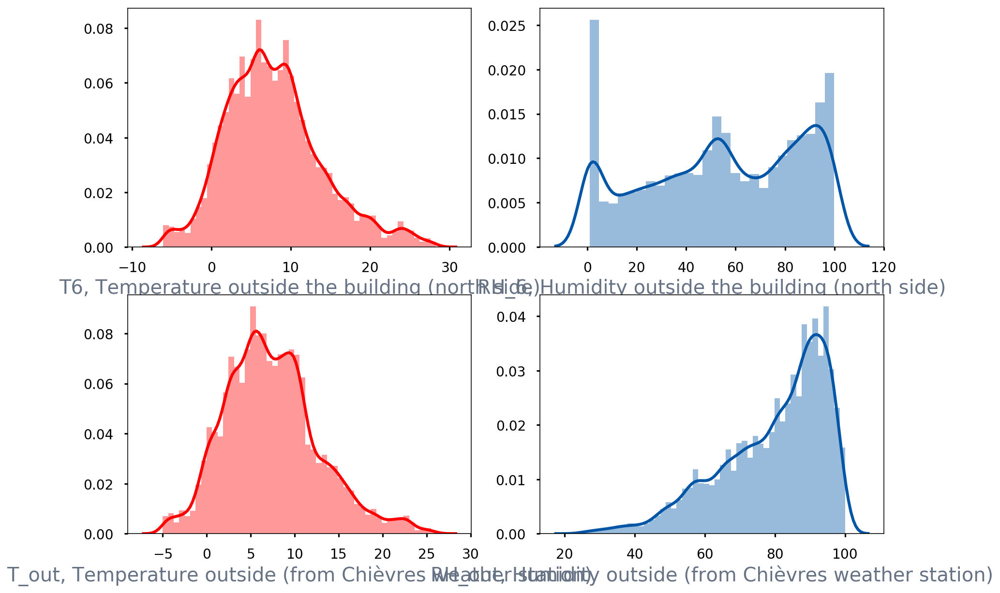

In [22]:
fig, ((ax1, ax3), (ax2, ax4)) = plt.subplots(figsize=(14,10), nrows=2, ncols=2)
sns.distplot(df.T6, color="red", ax=ax1, axlabel="T6, Temperature outside the building (north side)")
sns.distplot(df.T_out, color="red", ax=ax2, axlabel="T_out, Temperature outside (from Chièvres weather station)")
sns.distplot(df.RH_6, ax=ax3, axlabel="RH_6, Humidity outside the building (north side)")
sns.distplot(df.RH_out, ax=ax4, axlabel="RH_out, Humidity outside (from Chièvres weather station)");

It can be roughly be concluded:
* While the temperatures are related, **humidities vary significantly** between _Building Outside_ and _Chièvres Weather Station_
* Temparature peaks at 5°C

## Examining Pair-Wise Relationship

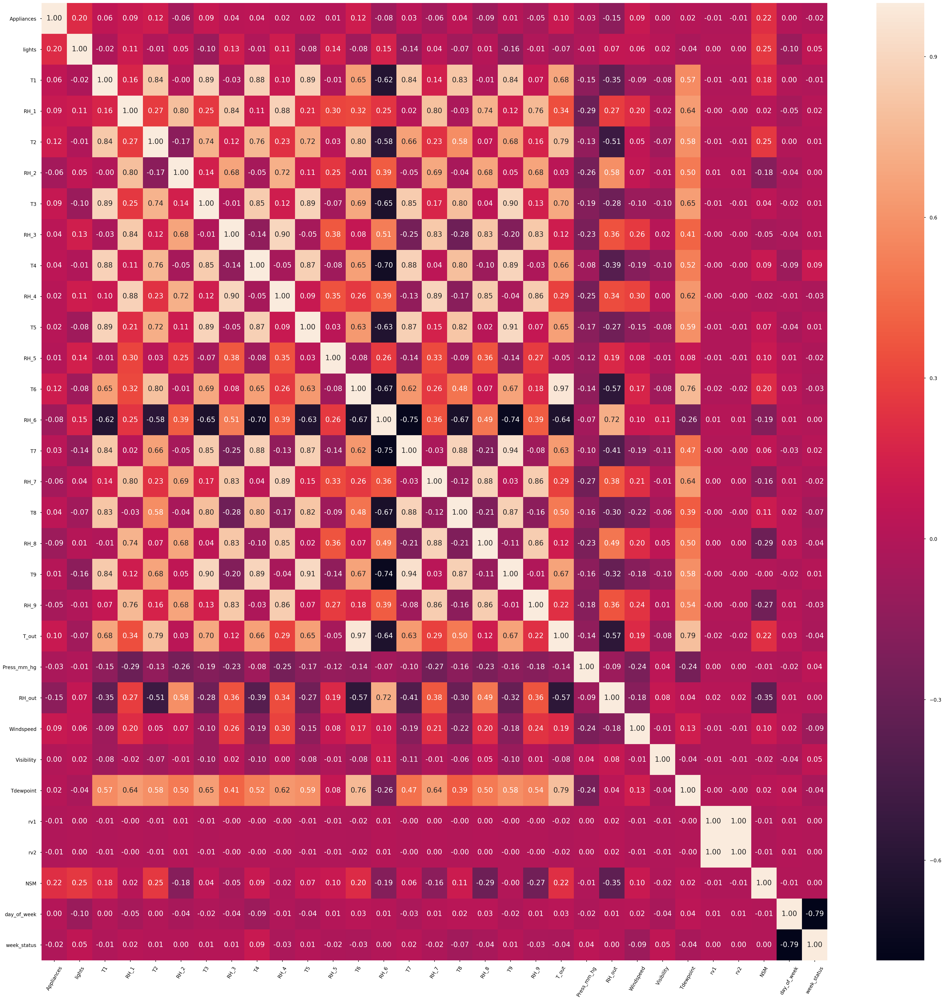

In [23]:
#Correlation Heat Map
plt.figure(figsize=(50,50));
a = sns.heatmap(df.corr(), annot=True, fmt=".2f", annot_kws={"size": 20});
rotx = a.set_xticklabels(a.get_xticklabels(), rotation=60)
plt.show();

From the above correlation map, it can be deduced that only following attributes are closely related (as compared to others) to Appliance's Energy Consumption:

>| Variables, Description | Correlation |
| :------ | :----------- |
| Lights, Light energy consumption | 0.20 |
| T2, Temperature in living room area | 0.12 |
| T6, Temperature outside the building (north side) | 0.12 |
| T_out, Temperature outside (from Chièvres weather station) | 0.10 |
| RH_out, Humidity outside (from Chièvres weather station) | -0.15 |
| NSM, Number of seconds from midnight | 0.22 |

Below are the scatter plots of these attributes with respect to Appliances Energy Cosumption:

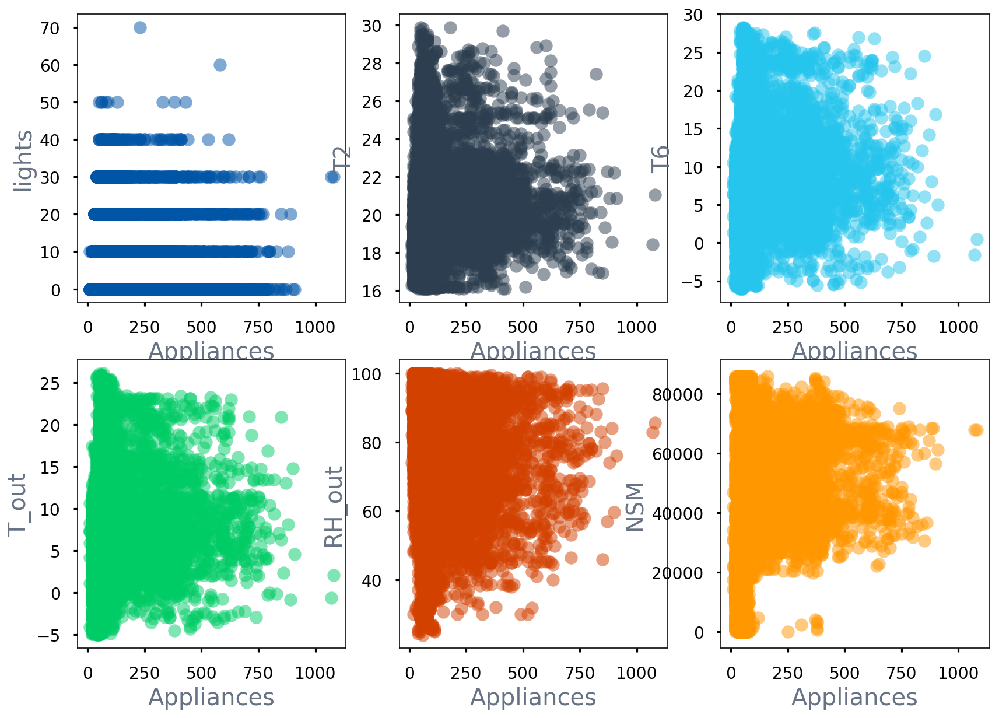

In [24]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(figsize=(14,10), nrows=2, ncols=3)
sns.regplot(x='Appliances', y='lights', data=df, fit_reg=False, scatter_kws={'alpha': 0.5}, ax = ax1)
sns.regplot(x='Appliances', y='T2', data=df, fit_reg=False, scatter_kws={'alpha': 0.5}, ax = ax2)
sns.regplot(x='Appliances', y='T6', data=df, fit_reg=False, scatter_kws={'alpha': 0.5}, ax = ax3)
sns.regplot(x='Appliances', y='T_out', data=df, fit_reg=False, scatter_kws={'alpha': 0.5}, ax = ax4)
sns.regplot(x='Appliances', y='RH_out', data=df, fit_reg=False, scatter_kws={'alpha': 0.5}, ax = ax5)
sns.regplot(x='Appliances', y='NSM', data=df, fit_reg=False, scatter_kws={'alpha': 0.5}, ax = ax6);

There are few very obvious outliers in these relationships. A quick check through the correlations:
 - Are there zeros?
     - Yes, zero is a possible observation for all the attributes except 'lights' which 77% of its data as zeros
 - Are there strange correlations?
     - Yes, the correlation is too scattered to figure out any pattern
     - NSM shows that appliances are usually used from morning 5:30am (20,000 sec past midnight) everyday
     - RH_out shows a rough interpretation that consumption increases with respect to the increase in humidity
 - Are there separate clusters (possible data recording error or anomaly)?
     - No, but there are many outliers

## Pandas Profiling

There is a library that gives a high level overview -- https://github.com/JosPolfliet/pandas-profiling

In [25]:
pandas_profiling.ProfileReport(df)

Number of variables,32
Number of observations,19735
Total Missing (%),0.0%
Total size in memory,4.8 MiB
Average record size in memory,256.0 B
Numeric,27
Categorical,0
Boolean,1
Date,1
Text (Unique),0
Rejected,3


From the above warnings, following can be deduced:
* Dropping the highly correlated attributes:
    * T9, Temperature in parents room and T7, Temperature in ironing room (ρ = 0.94478)
        * T9 is matter of importance, hence considering to **drop T7**
    * T_out, Temperature outside (from Chièvres weather station) and T6, Temperature outside the building (north side) (ρ = 0.97479)
        * As RH_out is more in correlation with 'Appliances' as compared to RH_6, considering to **drop T6**
    * rv2, Random Variable 2 and rv1, Random Variable 1 (ρ = 1)
        * As both of these attributes are equal, considering to **drop rv2**

In [26]:
df = df.drop(['T7', 'T6', 'rv2'], axis=1)

In [28]:
pivottablejs.pivot_ui(df)

## Examine relationship between Consumption and day of the week

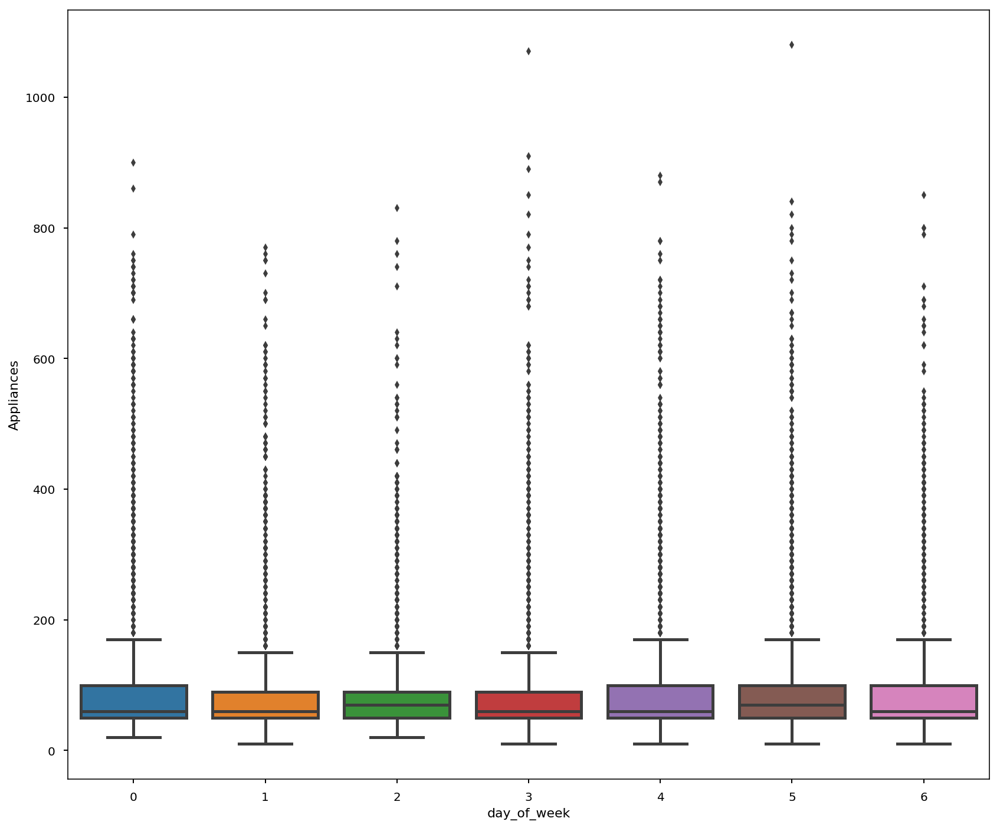

In [35]:
plt.figure(figsize=(14,12))
sns.boxplot(x='day_of_week', y='Appliances', data=df);

## Plotting Boxplots to observe the dispersion of the data and to check for outliers

{'boxes': [<matplotlib.lines.Line2D at 0x1f4dc327278>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4dc327da0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4dc315b00>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4dc3156a0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4dc327400>,
  <matplotlib.lines.Line2D at 0x1f4dc327940>]}

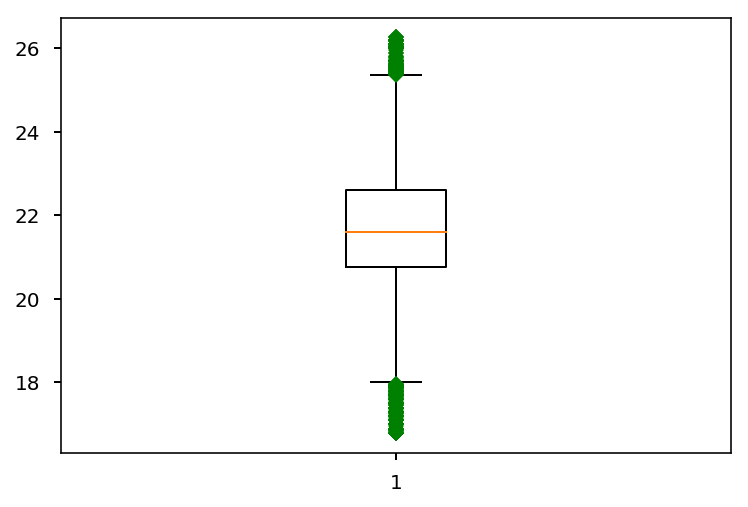

In [36]:
plt.figure()
plt.boxplot(df['T1'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4db568160>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4db568c88>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4db5539e8>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4db553588>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4db5682e8>,
  <matplotlib.lines.Line2D at 0x1f4db568828>]}

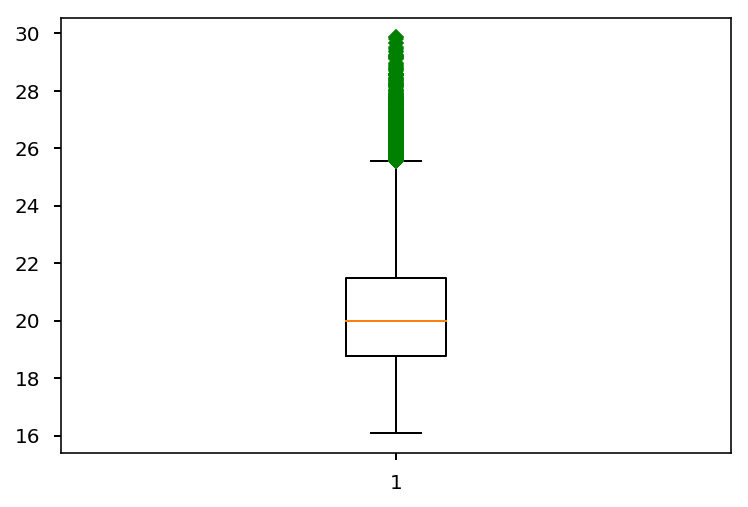

In [37]:
plt.figure()
plt.boxplot(df['T2'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d7507e10>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d7513978>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d751a6d8>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d751a278>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d7507f98>,
  <matplotlib.lines.Line2D at 0x1f4d7513518>]}

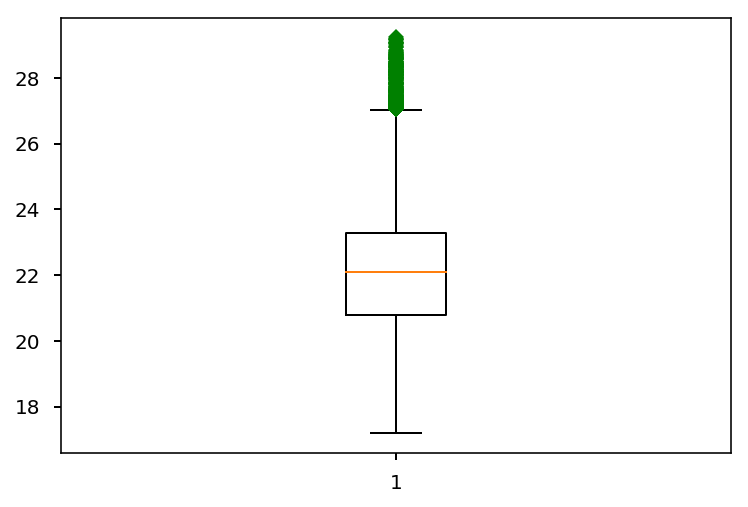

In [38]:
plt.figure()
plt.boxplot(df['T3'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d7ac1208>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d7ac1d30>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d7acaa90>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d7aca630>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d7ac1390>,
  <matplotlib.lines.Line2D at 0x1f4d7ac18d0>]}

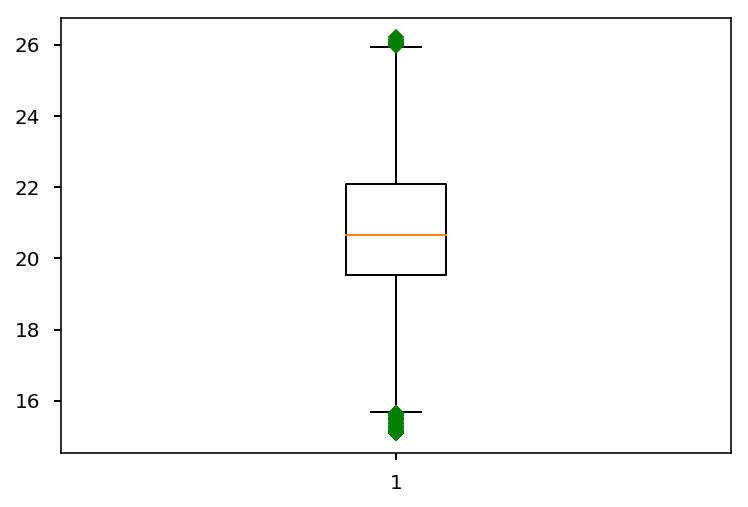

In [39]:
plt.figure()
plt.boxplot(df['T4'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d8100588>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d81090f0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d8109e10>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d81099b0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d8100710>,
  <matplotlib.lines.Line2D at 0x1f4d8100c50>]}

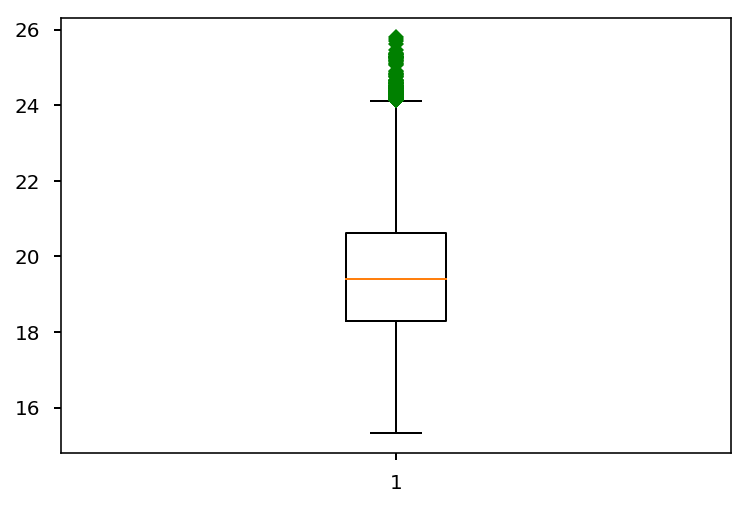

In [40]:
plt.figure()
plt.boxplot(df['T5'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d815f860>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d81663c8>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d816f128>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d8166c88>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d815f9e8>,
  <matplotlib.lines.Line2D at 0x1f4d815ff28>]}

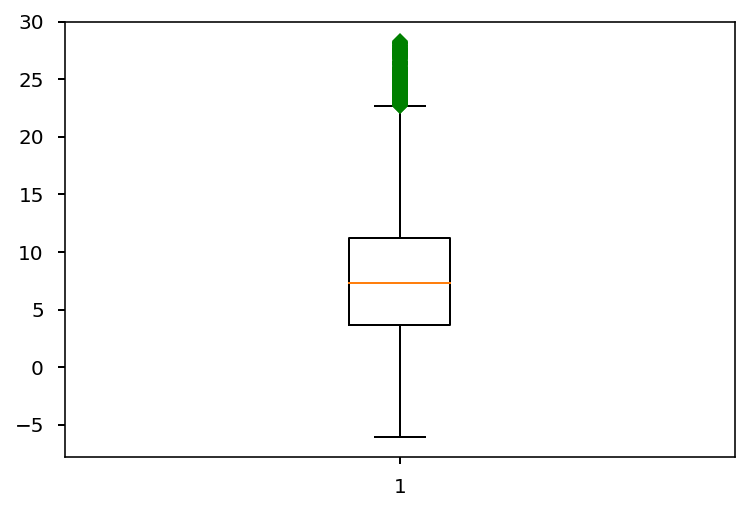

In [41]:
plt.figure()
plt.boxplot(df['T6'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d81c84a8>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d81c8fd0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d81d1d30>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d81d18d0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d81c8630>,
  <matplotlib.lines.Line2D at 0x1f4d81c8b70>]}

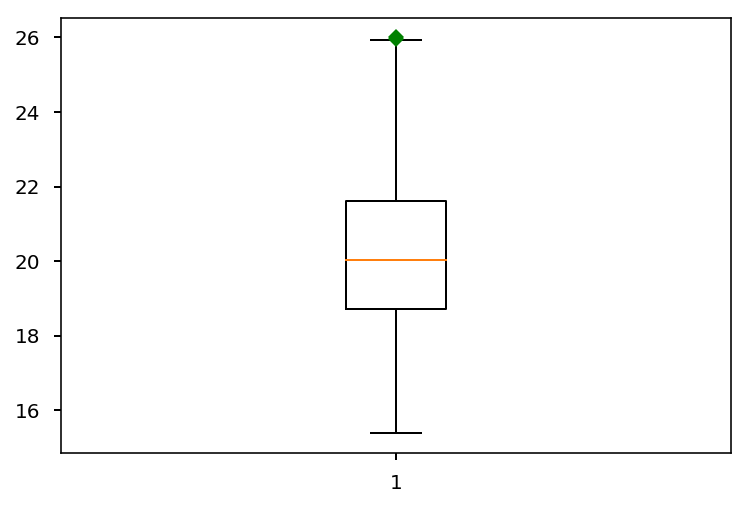

In [42]:
plt.figure()
plt.boxplot(df['T7'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d82897f0>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d8290358>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d82980b8>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d8290c18>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d8289978>,
  <matplotlib.lines.Line2D at 0x1f4d8289eb8>]}

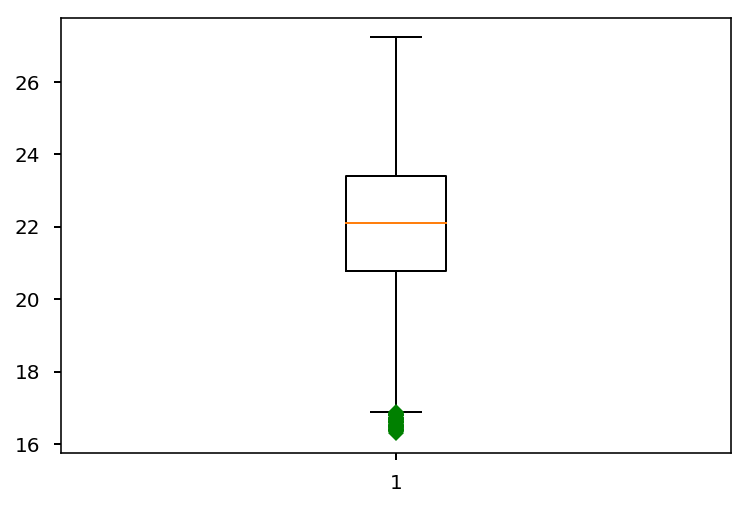

In [43]:
plt.figure()
plt.boxplot(df['T8'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d8385b38>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d83916a0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d8399400>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d8391f60>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d8385cc0>,
  <matplotlib.lines.Line2D at 0x1f4d8391240>]}

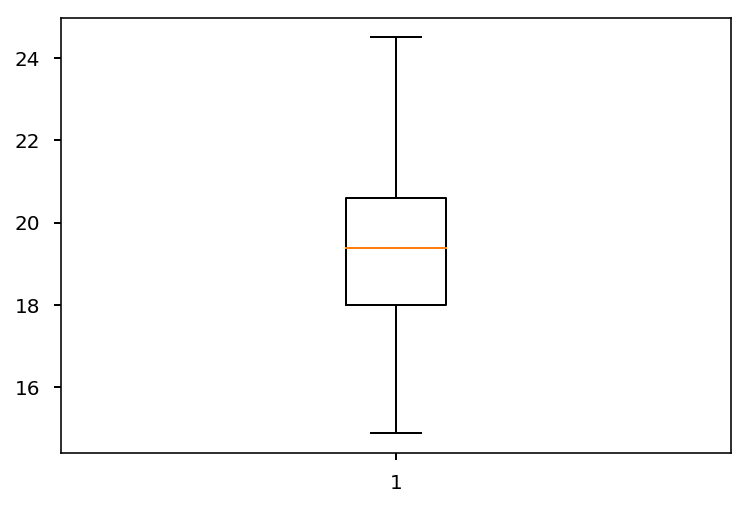

In [44]:
plt.figure()
plt.boxplot(df['T9'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d83e49e8>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d83ed550>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d83f72b0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d83ede10>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d83e4b70>,
  <matplotlib.lines.Line2D at 0x1f4d83ed0f0>]}

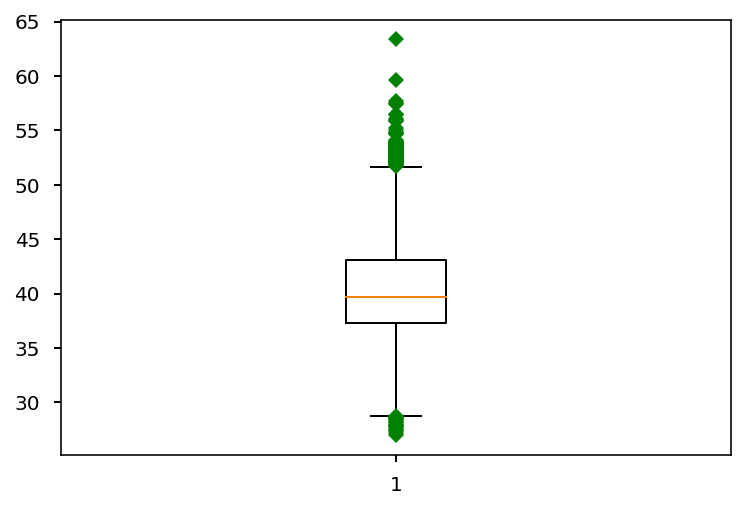

In [45]:
plt.figure()
plt.boxplot(df['RH_1'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d848b748>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d84962b0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d8496fd0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d8496b70>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d848b8d0>,
  <matplotlib.lines.Line2D at 0x1f4d848be10>]}

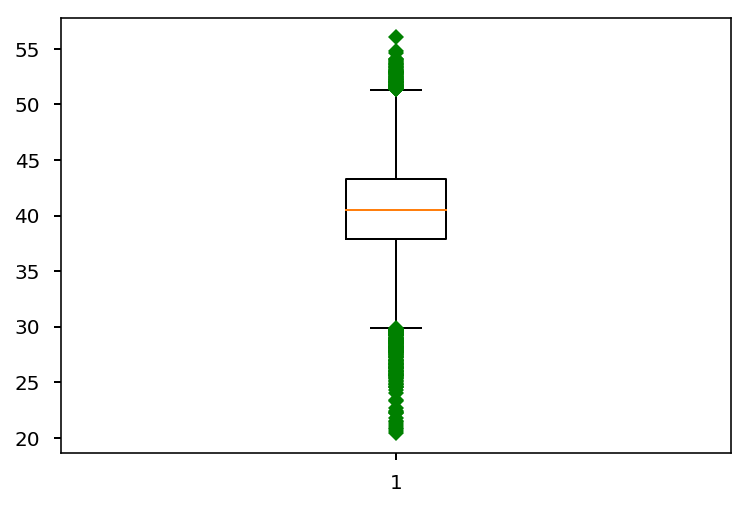

In [46]:
plt.figure()
plt.boxplot(df['RH_2'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d85354e0>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d853d048>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d853dd68>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d853d908>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d8535668>,
  <matplotlib.lines.Line2D at 0x1f4d8535ba8>]}

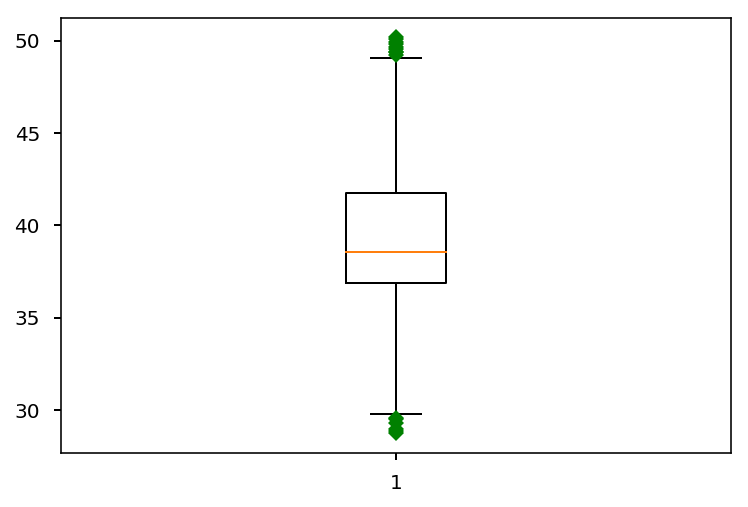

In [47]:
plt.figure()
plt.boxplot(df['RH_3'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d8616358>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d8616e80>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d861cbe0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d861c780>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d86164e0>,
  <matplotlib.lines.Line2D at 0x1f4d8616a20>]}

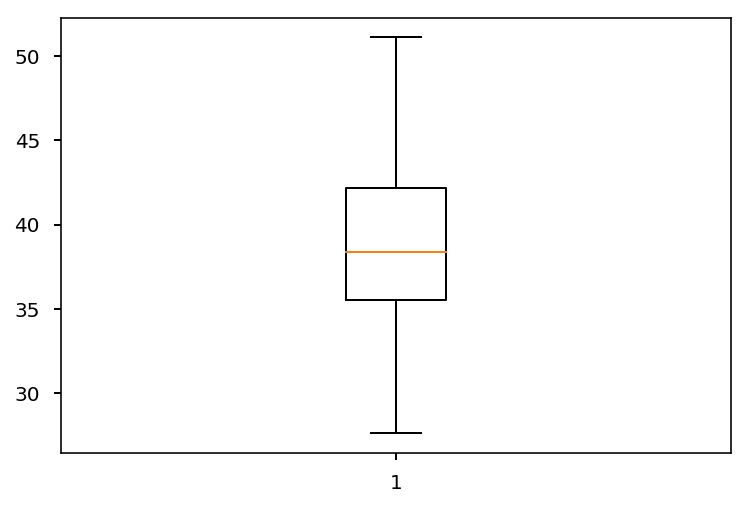

In [48]:
plt.figure()
plt.boxplot(df['RH_4'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d8834128>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d8834c50>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d883d9b0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d883d550>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d88342b0>,
  <matplotlib.lines.Line2D at 0x1f4d88347f0>]}

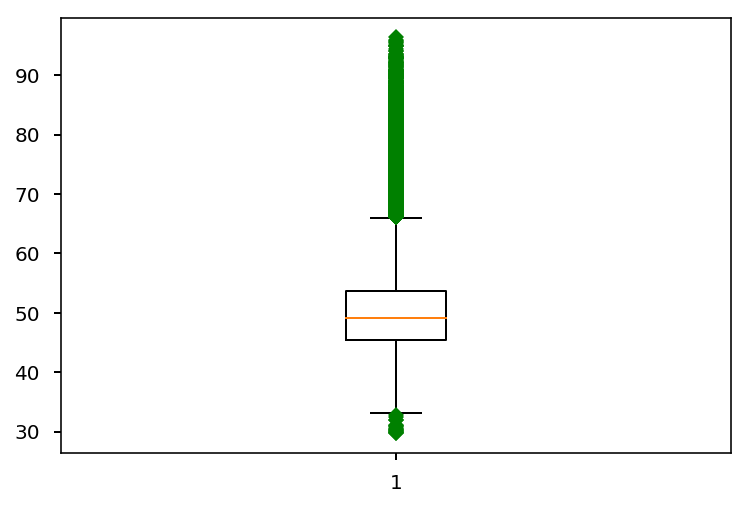

In [49]:
plt.figure()
plt.boxplot(df['RH_5'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d88949e8>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d889c550>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d88a52b0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d889ce10>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d8894b70>,
  <matplotlib.lines.Line2D at 0x1f4d889c0f0>]}

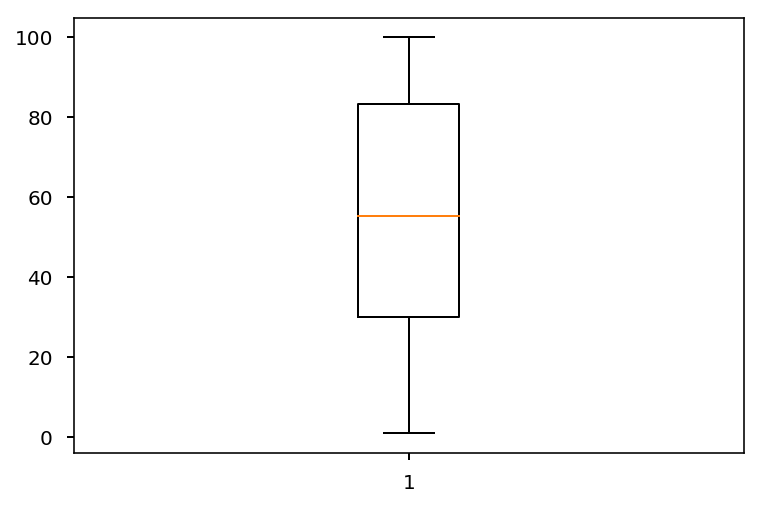

In [50]:
plt.figure()
plt.boxplot(df['RH_6'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4d9093cc0>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d909d828>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d90a6588>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d90a6128>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d9093e48>,
  <matplotlib.lines.Line2D at 0x1f4d909d3c8>]}

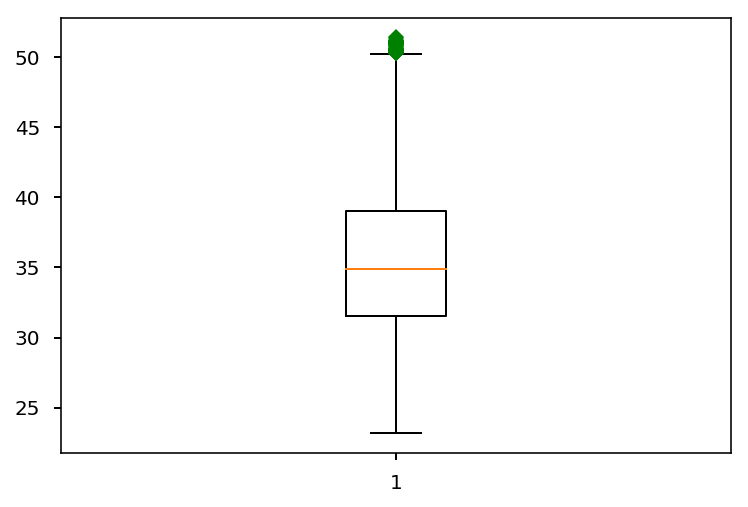

In [51]:
plt.figure()
plt.boxplot(df['RH_7'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4dbb3d080>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4dbb3dba8>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4dbb45908>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4dbb454a8>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4dbb3d208>,
  <matplotlib.lines.Line2D at 0x1f4dbb3d748>]}

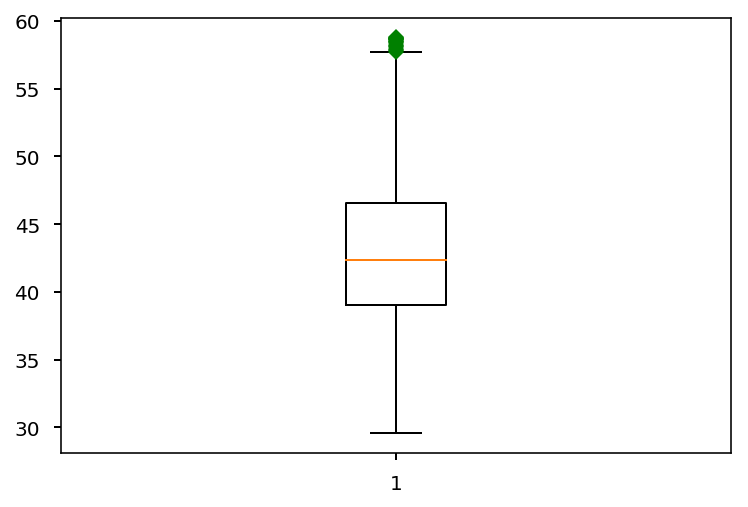

In [52]:
plt.figure()
plt.boxplot(df['RH_8'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4dbb9c898>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4dbba4400>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4dbbac160>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4dbba4cc0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4dbb9ca20>,
  <matplotlib.lines.Line2D at 0x1f4dbb9cf60>]}

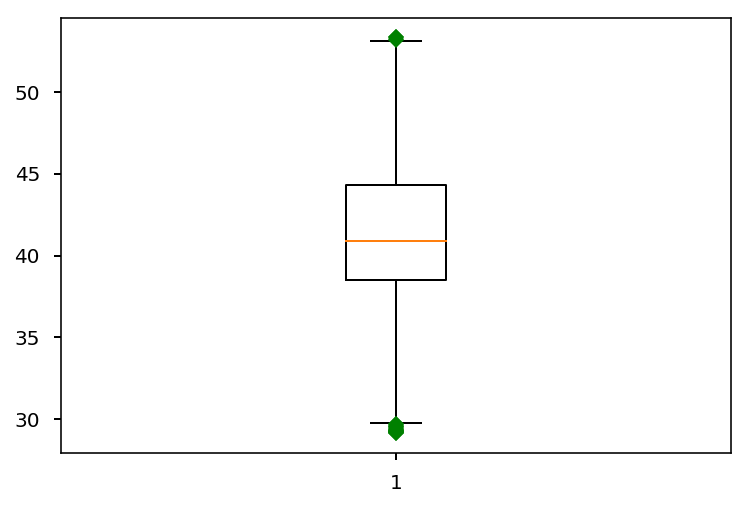

In [53]:
plt.figure()
plt.boxplot(df['RH_9'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4db4bf668>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d8437c50>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d8437f28>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d84377f0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4db4bf240>,
  <matplotlib.lines.Line2D at 0x1f4db4bfd68>]}

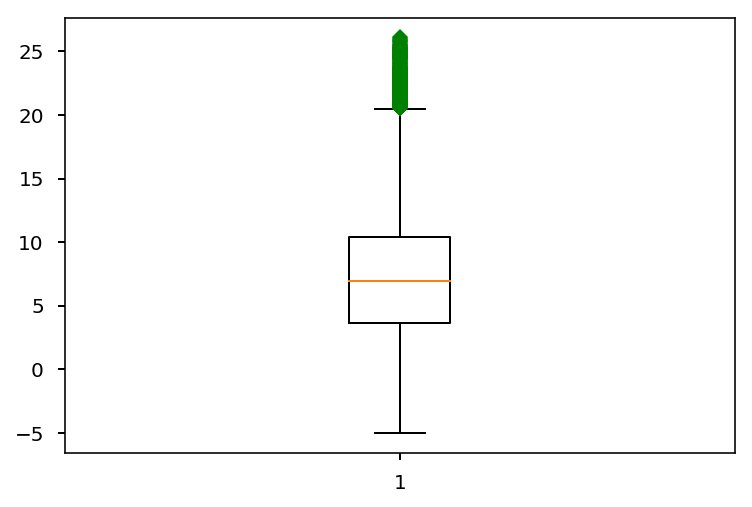

In [54]:
plt.figure()
plt.boxplot(df['T_out'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4db48a390>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4db48f2b0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4dc3dfb38>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4db275f28>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d8055b00>,
  <matplotlib.lines.Line2D at 0x1f4db48fa20>]}

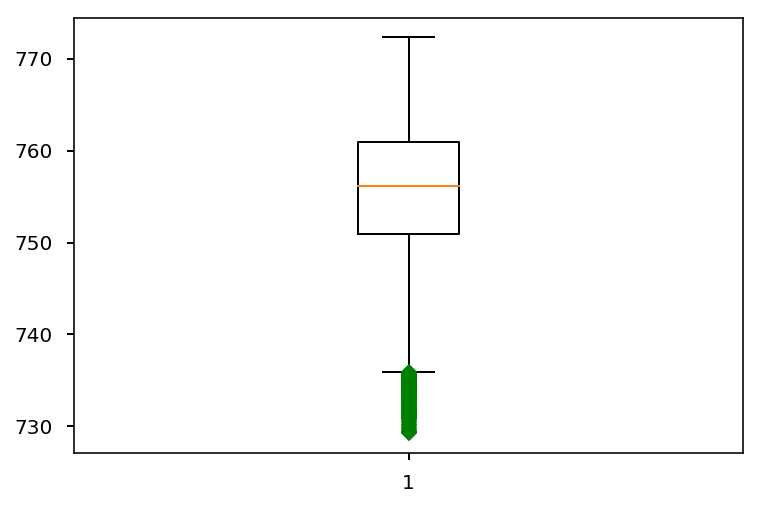

In [55]:
plt.figure()
plt.boxplot(df['Press_mm_hg'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4dc3b19e8>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4d728cba8>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4d8442a58>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4d8442c50>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4d8019320>,
  <matplotlib.lines.Line2D at 0x1f4d88c53c8>]}

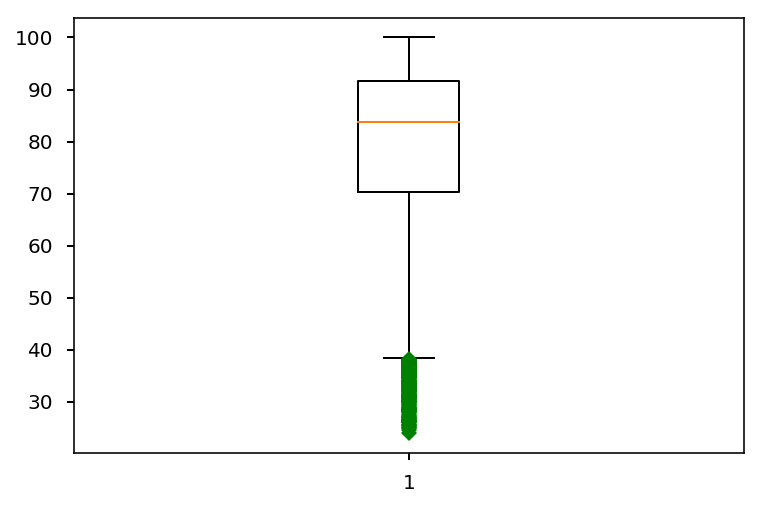

In [56]:
plt.figure()
plt.boxplot(df['RH_out'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4db4de518>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4db4c1080>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4db4c1da0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4db4c1940>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4db4de6a0>,
  <matplotlib.lines.Line2D at 0x1f4db4debe0>]}

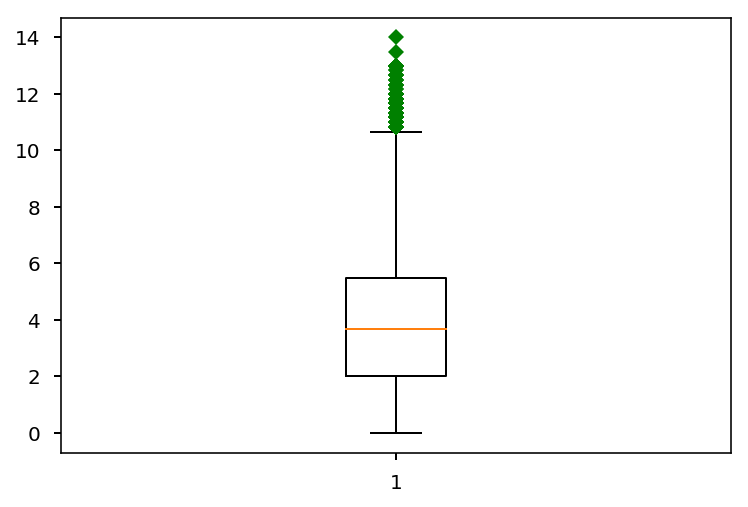

In [57]:
plt.figure()
plt.boxplot(df['Windspeed'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4dc9f8128>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4dc9f8c50>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4dc9ff9b0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4dc9ff550>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4dc9f82b0>,
  <matplotlib.lines.Line2D at 0x1f4dc9f87f0>]}

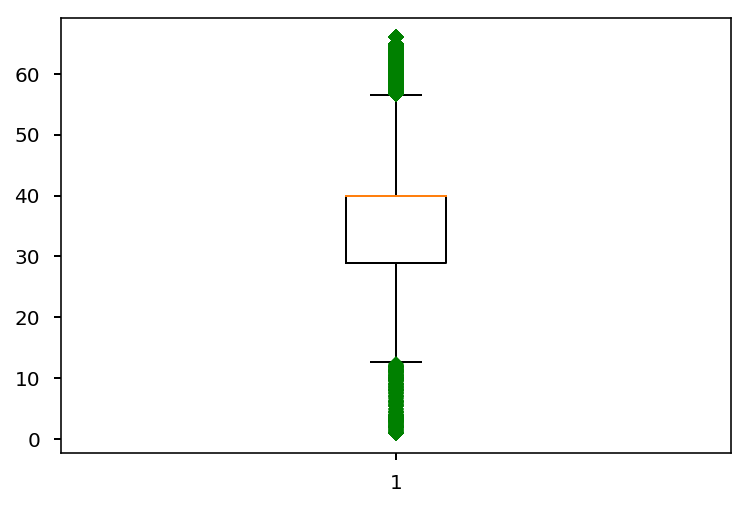

In [58]:
plt.figure()
plt.boxplot(df['Visibility'],0,'gD')

{'boxes': [<matplotlib.lines.Line2D at 0x1f4dca55908>],
 'caps': [<matplotlib.lines.Line2D at 0x1f4dca5f470>,
 'fliers': [<matplotlib.lines.Line2D at 0x1f4dca651d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x1f4dca5fd30>],
 'whiskers': [<matplotlib.lines.Line2D at 0x1f4dca55a90>,
  <matplotlib.lines.Line2D at 0x1f4dca55fd0>]}

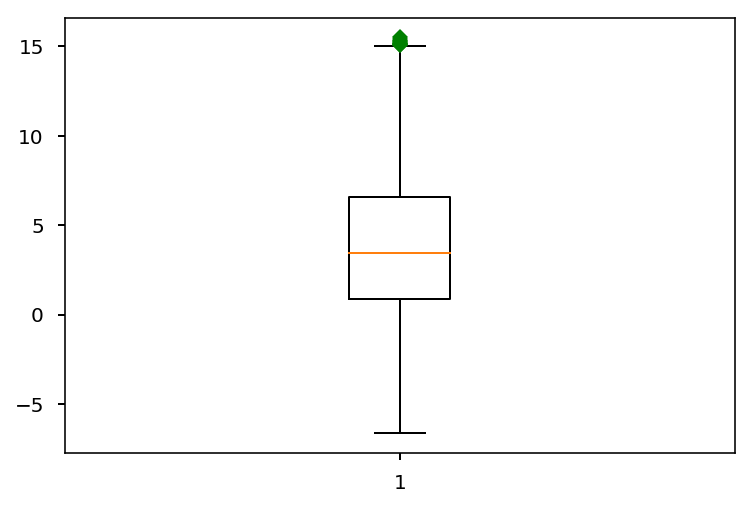

In [59]:
plt.figure()
plt.boxplot(df['Tdewpoint'],0,'gD')

From the above plots we concluded that the data is widely spread above the median which is clear indication of outliers

# Now Detecting outliers for each variable

To detect outliers in the dataset we will proceed with the following steps
>1. Arrange all the dataset points and calculate median
>2. Calculate the upper quartile
>3. Calculate the lower quartile
>> Since the above three aspects are given in the dataset
>4. Calculate the Interquartile Range
>> It is the product of difference of the upper quartile and lower quartile and numeric value of 1.5
>5. Calculate the inner fences for the dataset
>> It is set of numerical boundaries which is classified as major and minor outlier
>>>Major outlier = Upper Quartile + Interquartile rannge
>>>| Minor outlier = Lower Quartlie - Interquartile rannge

Table calculating outliers for each variable
<table>
    <thead class="valign-top">
        <tr>
            <th scope="col" class="rowsep-1 align-left">Variables</th>
            <th scope="col" class="rowsep-1 align-left">Upper Quartile</th>
            <th scope="col" class="rowsep-1 align-left">Lower Quartile</th>
            <th scope="col" class="rowsep-1 align-left">Interquartile Range</th>
            <th scope="col" class="rowsep-1 align-left">Major Outlier</th>
            <th scope="col" class="rowsep-1 align-left">Minor Outlier</th>
        </tr>
    </thead>
    <tbody>
        <tr>
        <th class="align-left" scope="row">T1</th>
            <td class="align-left">22.6</td>
            <td class="align-left">20.73</td>
            <td class="align-left">2.805</td>
            <td class="align-left">24.80</td>
            <td class="align-left">18.40</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_1</th>
            <td class="align-left">43.09</td>
            <td class="align-left">37.36</td>
            <td class="align-left">8.595</td>
            <td class="align-left">51.25</td>
            <td class="align-left">28.50</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T2</th>
            <td class="align-left">21.50</td>
            <td class="align-left">18.82</td>
            <td class="align-left">4.02</td>
            <td class="align-left">24.30</td>
            <td class="align-left">14.80</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_2</th>
            <td class="align-left">43.29</td>
            <td class="align-left">37.90</td>
            <td class="align-left">8.08</td>
            <td class="align-left">50.50</td>
            <td class="align-left">32</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T3</th>
            <td class="align-left">23.29</td>
            <td class="align-left">20.79</td>
            <td class="align-left">3.75</td>
            <td class="align-left">26.20</td>
            <td class="align-left">17.04</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_3</th>
            <td class="align-left">41.76</td>
            <td class="align-left">36.90</td>
            <td class="align-left">7.29</td>
            <td class="align-left">46.50</td>
            <td class="align-left">30</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T4</th>
            <td class="align-left">22.10</td>
            <td class="align-left">19.50</td>
            <td class="align-left">3.90</td>
            <td class="align-left">24.50</td>
            <td class="align-left">16.50</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_4</th>
            <td class="align-left">42.13</td>
            <td class="align-left">35.53</td>
            <td class="align-left">9.90</td>
            <td class="align-left">49</td>
            <td class="align-left">25.60</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T5</th>
            <td class="align-left">20.60</td>
            <td class="align-left">18.26</td>
            <td class="align-left">3.51</td>
            <td class="align-left">22.80</td>
            <td class="align-left">14.75</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_5</th>
            <td class="align-left">53.66</td>
            <td class="align-left">45.40</td>
            <td class="align-left">12.39</td>
            <td class="align-left">62.80</td>
            <td class="align-left">34</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T6</th>
            <td class="align-left">11.24</td>
            <td class="align-left">3.65</td>
            <td class="align-left">11.38</td>
            <td class="align-left">18</td>
            <td class="align-left">-7.73</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_6</th>
            <td class="align-left">83.32</td>
            <td class="align-left">30.09</td>
            <td class="align-left">79.84</td>
            <td class="align-left">163.16</td>
            <td class="align-left">-49.75</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T7</th>
            <td class="align-left">21.60</td>
            <td class="align-left">18.70</td>
            <td class="align-left">4.35</td>
            <td class="align-left">25.90</td>
            <td class="align-left">14.35</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_7</th>
            <td class="align-left">39</td>
            <td class="align-left">31.50</td>
            <td class="align-left">11.25</td>
            <td class="align-left">47</td>
            <td class="align-left">20.25</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T8</th>
            <td class="align-left">23.39</td>
            <td class="align-left">20.79</td>
            <td class="align-left">3.90</td>
            <td class="align-left">27.29</td>
            <td class="align-left">17.20</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_8</th>
            <td class="align-left">46.56</td>
            <td class="align-left">39.06</td>
            <td class="align-left">11.25</td>
            <td class="align-left">54.70</td>
            <td class="align-left">27.81</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T9</th>
            <td class="align-left">20.60</td>
            <td class="align-left">18</td>
            <td class="align-left">3.90</td>
            <td class="align-left">23.60</td>
            <td class="align-left">14.10</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_9</th>
            <td class="align-left">44.36</td>
            <td class="align-left">38.50</td>
            <td class="align-left">8.79</td>
            <td class="align-left">50.50</td>
            <td class="align-left">32</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">T_out</th>
            <td class="align-left">10.40</td>
            <td class="align-left">3.66</td>
            <td class="align-left">10.11</td>
            <td class="align-left">17.50</td>
            <td class="align-left">-6.45</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">RH_out</th>
            <td class="align-left">91.66</td>
            <td class="align-left">70</td>
            <td class="align-left">32.49</td>
            <td class="align-left">124.15</td>
            <td class="align-left">46</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">Press_mm_hg</th>
            <td class="align-left">76.093</td>
            <td class="align-left">750.86</td>
            <td class="align-left">15.105</td>
            <td class="align-left">776.035</td>
            <td class="align-left">736</td>
        </tr>
        <tr>
            <th class="align-left" scope="row">Tdewpoint</th>
            <td class="align-left">6.53</td>
            <td class="align-left">0.9</td>
            <td class="align-left">8.445</td>
            <td class="align-left">12.50</td>
            <td class="align-left">-7.54</td>
         </tr>
            
        




# Removing Outliers from specific variables

In [60]:
#dropping outliers from T1
df= df.drop(df[(df['T1']>24.80) | (df['T1']<18.40)].index)

In [61]:
#dropping outliers from RH_1
df= df.drop(df[(df['RH_1']>51.25) | (df['RH_1']<28.50)].index)

In [62]:
#dropping Outliers from T2
df= df.drop(df[df['T2']>24.30].index)

In [63]:
#dropping outliers from RH_2
df= df.drop(df[(df['RH_2']>50.50) | (df['RH_2']<32)].index)

In [64]:
#dropping outliers from T3
df= df.drop(df[df['T3']>26.20].index)

In [65]:
#dropping outliers from RH_3
df= df.drop(df[(df['RH_3']>46.5) | (df['RH_3']<30)].index)

In [66]:
#dropping outliers from T4
df= df.drop(df[(df['T4']>24.5) | (df['T4']<16.5)].index)

In [67]:
#dropping outliers from RH_4
df= df.drop(df[df['RH_4']>49].index)

In [68]:
#dropping outliers from T5
df= df.drop(df[df['T5']>22.8].index)

In [69]:
#dropping outliers from RH_5
df= df.drop(df[(df['RH_5']>62.8) | (df['RH_5']<34)].index)

In [70]:
#dropping outliers from T6
df= df.drop(df[df['T6']>18].index)

In [71]:
#dropping outliers from T7
df= df.drop(df[df['T7']>25.90].index)

In [72]:
#dropping outliers from RH_7
df= df.drop(df[df['RH_7']>47].index)

In [73]:
#dropping outliers from T8
df= df.drop(df[df['T8']<17.2].index)

In [74]:
#dropping outliers from RH_8
df= df.drop(df[df['RH_8']>54.7].index)

In [75]:
#dropping outliers from T9
df= df.drop(df[df['T9']>23.6].index)

In [76]:
#dropping outliers from RH_9
df= df.drop(df[(df['RH_9']>50.5) | (df['RH_9']<32)].index)

In [77]:
#dropping outliers from T_out
df= df.drop(df[df['T_out']>17.5].index)

In [78]:
#dropping outliers from Press_mm_hg
df= df.drop(df[df['Press_mm_hg']<736].index)

In [79]:
#dropping outliers from Tdewpoint
df= df.drop(df[df['Tdewpoint']>12.5].index)

## Correlation Analysis 

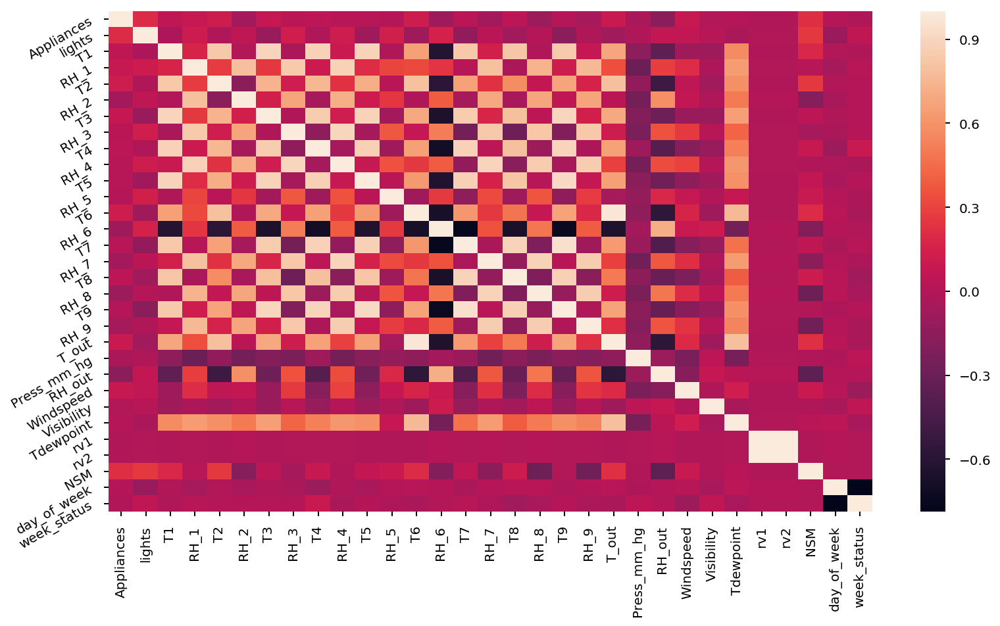

In [18]:
#Correlation and heat map
correlation = df.corr()
sns.set_context("notebook", font_scale = 1.0, rc = {"lines.linewidth" : 2.5})
plt.figure(figsize=(13, 7))
a = sns.heatmap(correlation, fmt = '.2f')

rotx = a.set_xticklabels(a.get_xticklabels(), rotation=90)
roty = a.set_yticklabels(a.get_yticklabels(), rotation=30)

Creating new dataframe 

In [119]:
df_1 = df[['Appliances','T1','RH_1','T2','RH_2','T3','RH_3']]

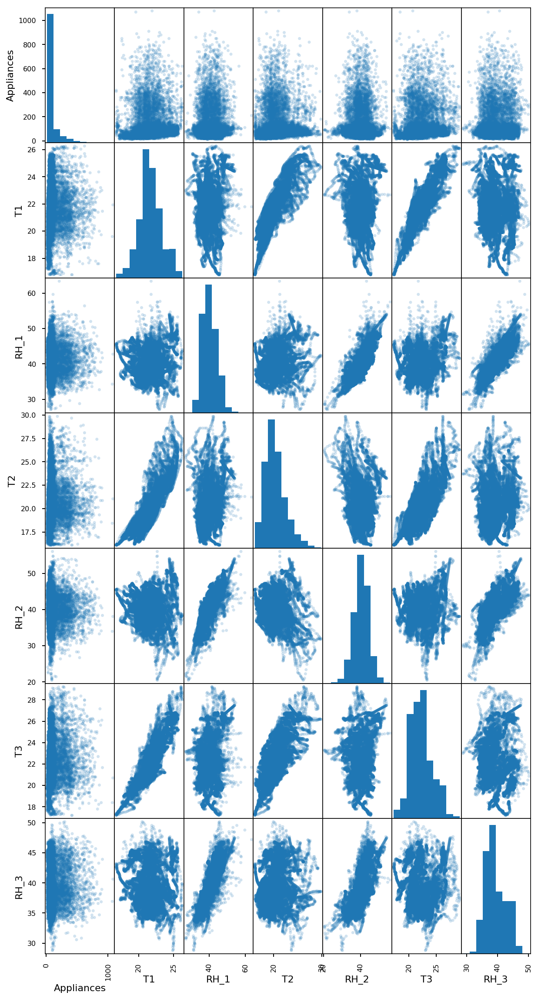

In [117]:
fig, ax= plt.subplots(figsize=(10 ,20))
scatter_matrix(df[['Appliances','T1','RH_1','T2','RH_2','T3','RH_3']],alpha=0.2,ax=ax);

In [26]:
df_2 = df[['Appliances','T4','RH_4','T5','RH_5','T6','RH_6']]

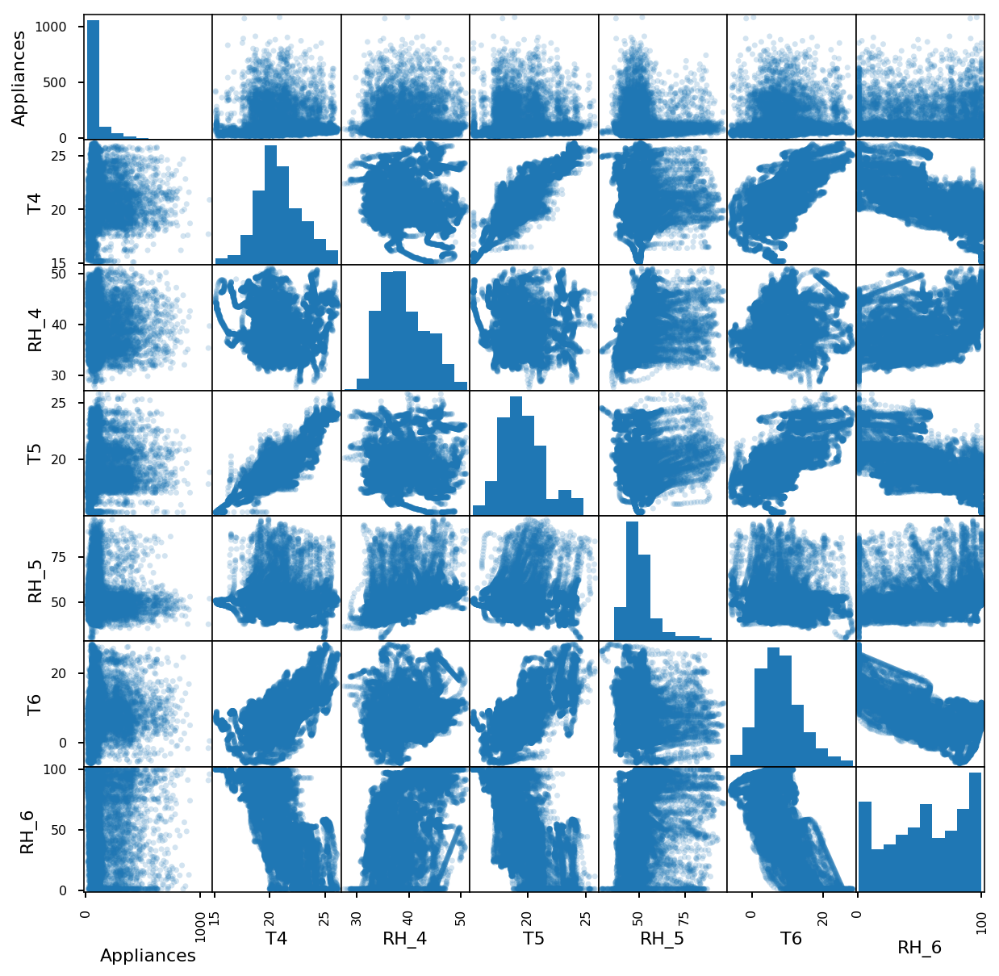

In [27]:
fig, ax= plt.subplots(figsize=(10 ,10))
scatter_matrix(df_2[['Appliances','T4','RH_4','T5','RH_5','T6','RH_6']],alpha=0.2,diagonal='hist',ax=ax);

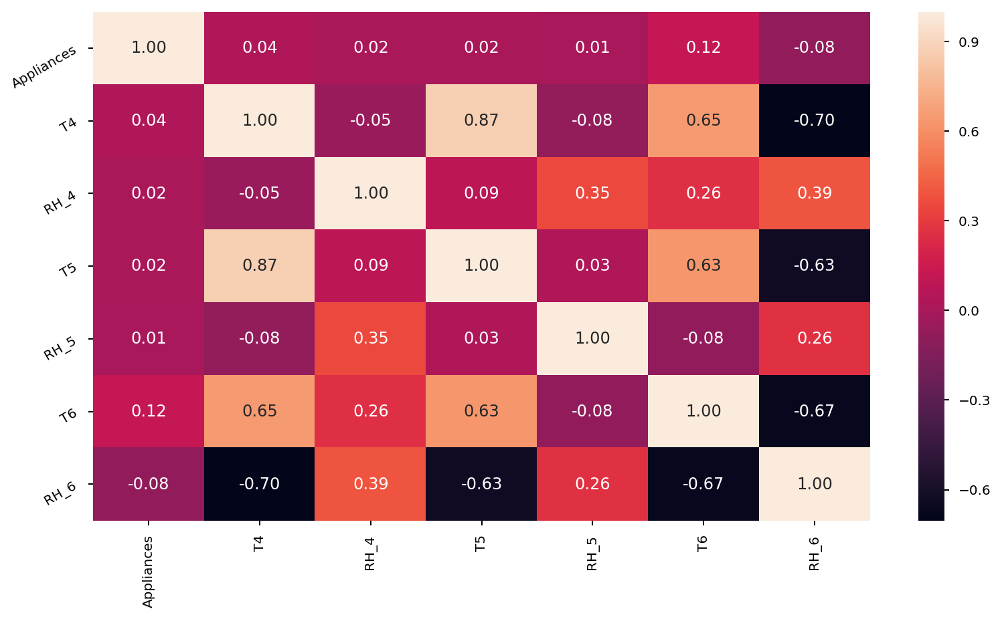

In [28]:
#Correlation and heat map
correlation = df_2.corr()
sns.set_context("notebook", font_scale = 1.0, rc = {"lines.linewidth" : 2.5})
plt.figure(figsize=(13, 7))
a = sns.heatmap(correlation,annot = True, fmt = '.2f')

rotx = a.set_xticklabels(a.get_xticklabels(), rotation=90)
roty = a.set_yticklabels(a.get_yticklabels(), rotation=30)

In [29]:
df_3=df[['Appliances','T7','RH_7','T8','RH_8','T9','RH_9']]

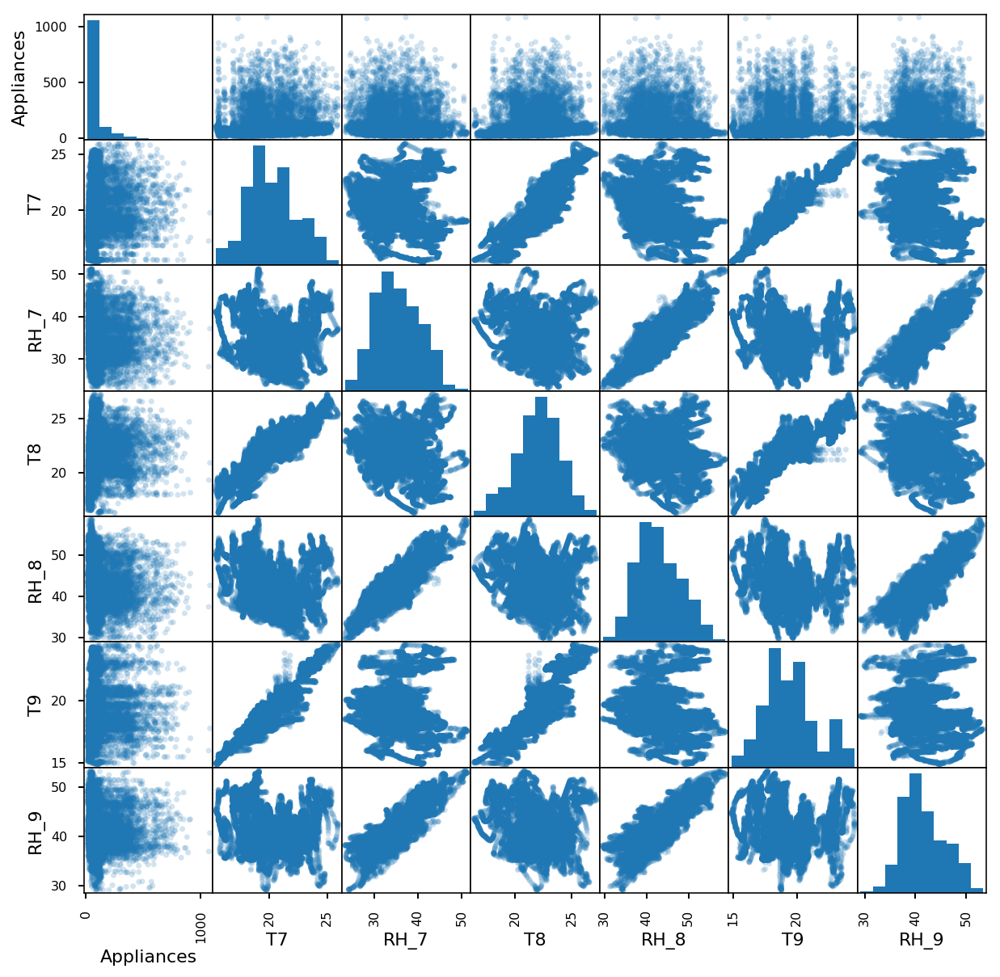

In [30]:
fig, ax= plt.subplots(figsize=(10 ,10))
scatter_matrix(df_3[['Appliances','T7','RH_7','T8','RH_8','T9','RH_9']],alpha=0.2,diagonal='hist',ax=ax);

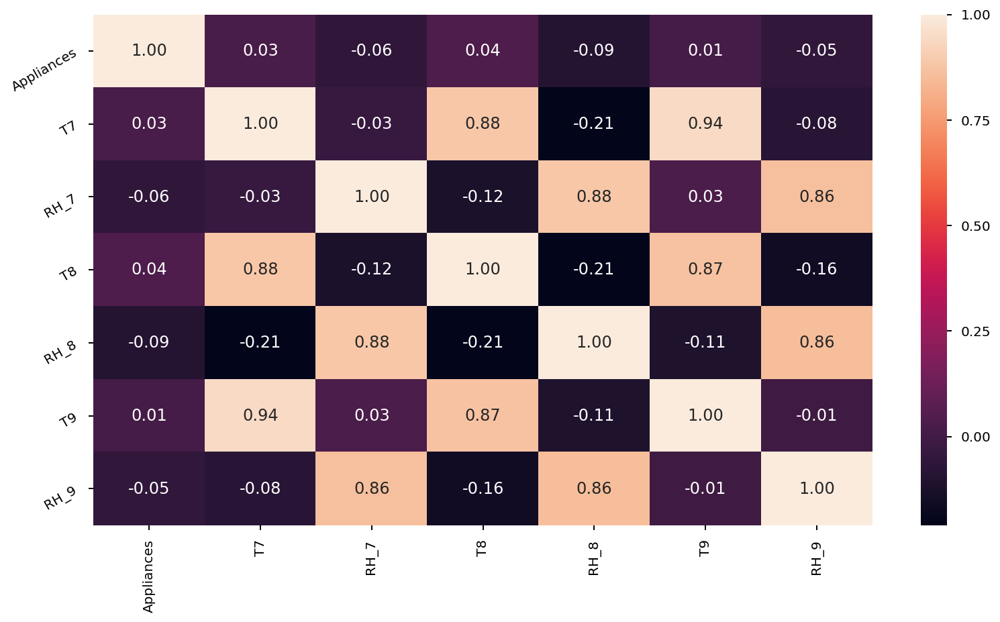

In [31]:
#Correlation and heat map
correlation = df_3.corr()
sns.set_context("notebook", font_scale = 1.0, rc = {"lines.linewidth" : 2.5})
plt.figure(figsize=(13, 7))
a = sns.heatmap(correlation,annot = True, fmt = '.2f')

rotx = a.set_xticklabels(a.get_xticklabels(), rotation=90)
roty = a.set_yticklabels(a.get_yticklabels(), rotation=30)

In [32]:
df_4 = df[['Appliances','T_out','Press_mm_hg','RH_out','Windspeed','Visibility','Tdewpoint']]

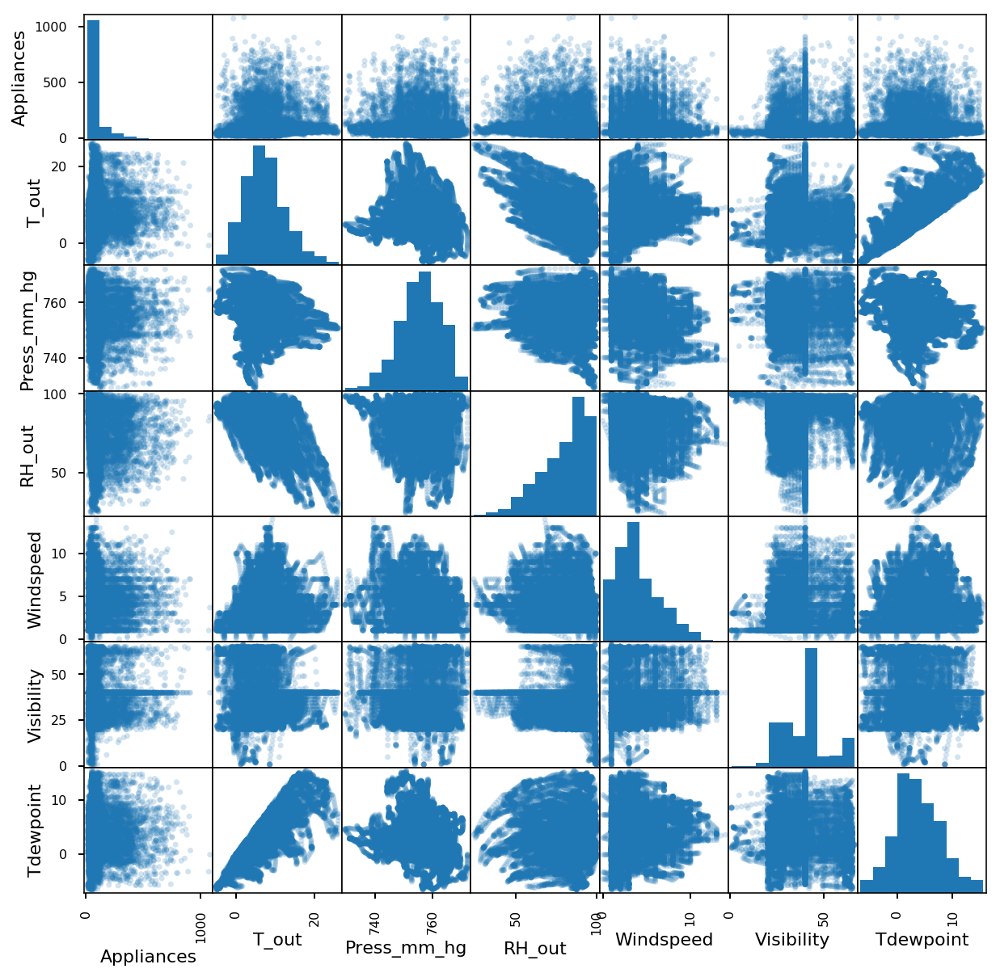

In [33]:
fig, ax= plt.subplots(figsize=(10 ,10))
scatter_matrix(df_4[['Appliances','T_out','Press_mm_hg','RH_out','Windspeed','Visibility','Tdewpoint']],alpha=0.2,diagonal='hist',ax=ax);

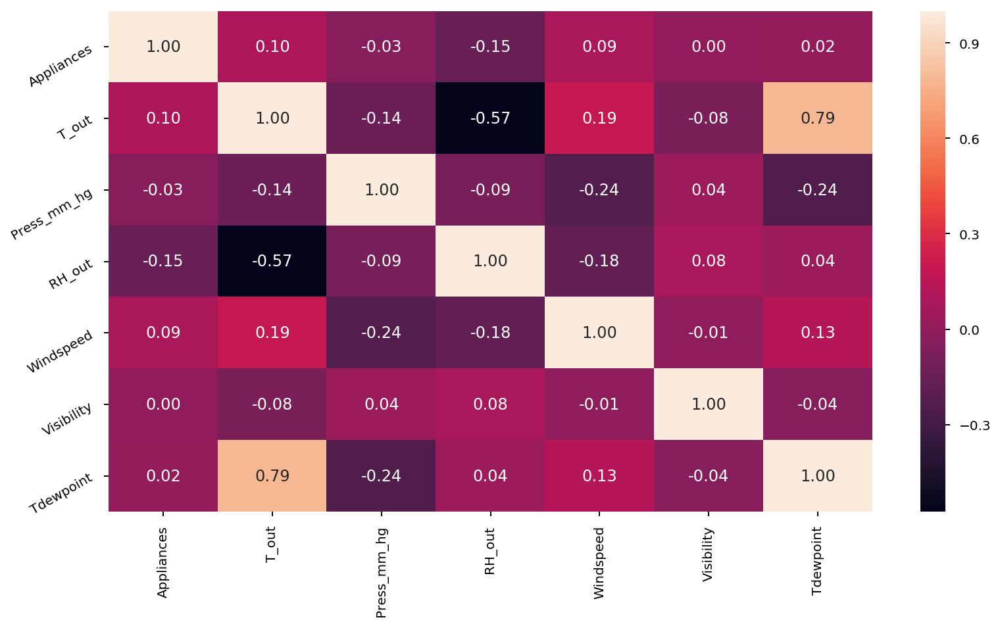

In [34]:
#Correlation and heat map
correlation = df_4.corr()
sns.set_context("notebook", font_scale = 1.0, rc = {"lines.linewidth" : 2.5})
plt.figure(figsize=(13, 7))
a = sns.heatmap(correlation,annot = True, fmt = '.2f')

rotx = a.set_xticklabels(a.get_xticklabels(), rotation=90)
roty = a.set_yticklabels(a.get_yticklabels(), rotation=30)